# Notebook to determine the location with the most historical snowfall in the US

work in progress

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [8]:
import xarray as xr
import matplotlib.pyplot as plt
import datetime as dt
import pandas as pd

import numpy as np

#from dask.distributed import Client
#import dask.dataframe as dd

import datetime

import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy
import numpy as np

### snowfall datasets from https://www.nohrsc.noaa.gov/snowfall/

In [10]:
df = xr.open_mfdataset('/home/scottcha/Downloads/sfav2_CONUS_*.nc', concat_dim='Season', combine='nested')

In [11]:
df

<xarray.Dataset>
Dimensions:     (Season: 12, lat: 850, lon: 1500, nv: 2)
Coordinates:
  * lat         (lat) float64 54.98 54.94 54.9 54.86 ... 21.14 21.1 21.06 21.02
  * lon         (lon) float64 -126.0 -125.9 -125.9 ... -66.1 -66.06 -66.02
Dimensions without coordinates: Season, nv
Data variables:
    lat_bounds  (Season, lat, nv) float64 dask.array<concatenate, shape=(12, ...
    lon_bounds  (Season, lon, nv) float64 dask.array<concatenate, shape=(12, ...
    crs         (Season) int16 -32767 -32767 -32767 ... -32767 -32767 -32767
    Data        (Season, lat, lon) float32 dask.array<concatenate, shape=(12,...
Attributes:
    format_version:  NOHRSC NetCDF raster file v1.2
    Conventions:     CF-1.6
    title:           The National Snowfall Analysis, Version 2.1, is based on...
    source:          surface observations of snowfall; Stage IV QPE; HRRR; GH...
    history:         2019-02-25 08:57:27 UTC created by module: aggregate_sno...
    comment:         2019-02-25 08:57:27 UTC created comment: aggregate_snowf...
    references:      Not applicable

In [12]:
#df1 = xr.open_dataset('/home/scottcha/Downloads/sfav2_CONUS_2019093012_to_2020092712.nc')

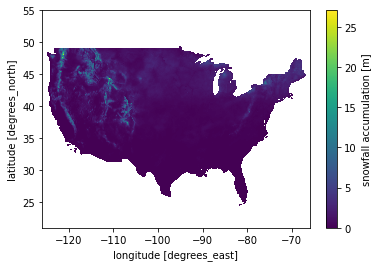

In [13]:
df.isel(Season=0).Data.plot()

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


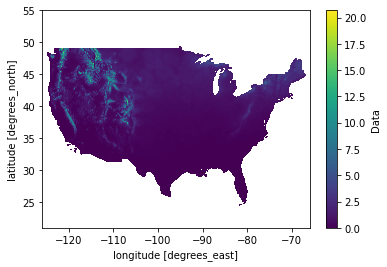

In [14]:
df.mean(dim='Season', skipna=True).Data.plot()

In [15]:
df = df.mean(dim='Season')

## Add some map details

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


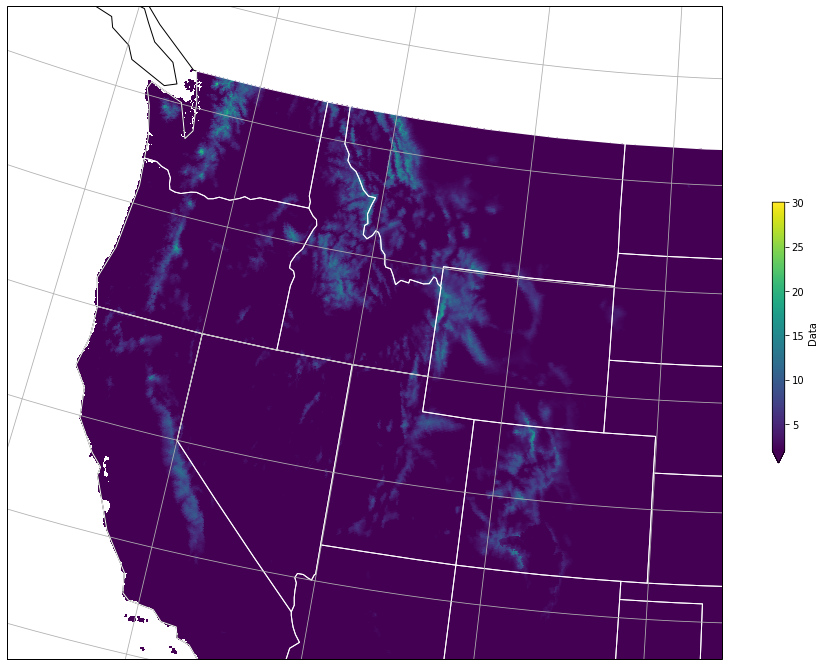

In [16]:
central_lat = 50
central_lon = -96
fig = plt.figure(figsize=(18,12))
ax = plt.axes(projection=ccrs.AlbersEqualArea(central_lon, central_lat))
df.Data.plot(ax=ax, transform=ccrs.PlateCarree(),
         vmin=2, vmax=30, cbar_kwargs={'shrink': 0.4})
ax.coastlines()
ax.gridlines()
ax.add_feature(cartopy.feature.STATES, edgecolor='white')
extent = [-125, -100, 35, 50.5]
ax.set_extent(extent)

## Calcualte the Max Values

In [26]:
import cartopy.io.shapereader as shpr
fname = shpr.natural_earth(resolution='10m', category='cultural', name='populated_places')
reader = shpr.Reader(fname)


In [27]:
import cartopy.io.img_tiles as cimgt
stamen_terrain = cimgt.Stamen('terrain-background')
google_tiles = cimgt.GoogleTiles(desired_tile_form='RGB', style='satellite')

In [28]:
points = list(reader.geometries())
labels = list(reader.records())

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


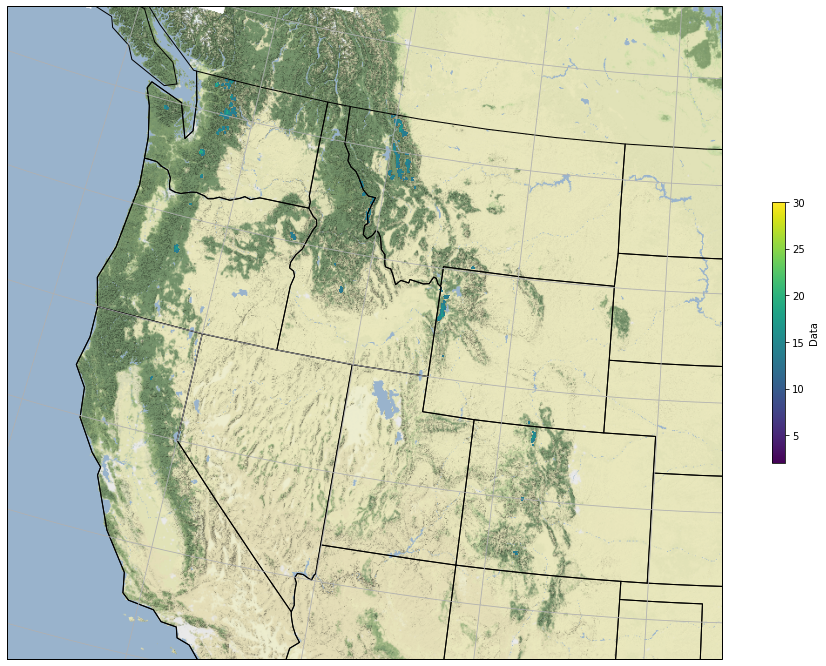

In [33]:
fig = plt.figure(figsize=(18,12))

ax = plt.axes(projection=ccrs.AlbersEqualArea(central_lon, central_lat))
df.where(df.Data > 13.0).Data.plot(ax=ax, transform=ccrs.PlateCarree(),
         vmin=2, vmax=30, cbar_kwargs={'shrink': 0.4})
ax.coastlines()
ax.gridlines()
ax.add_feature(cartopy.feature.STATES, edgecolor='black')
lon_min = -125
lon_max = -100
lat_min=35
lat_max=50.5
extent = [lon_min, lon_max, lat_min, lat_max]

#for l in labels:
#    lat = l.attributes['LATITUDE']
#    lon = l.attributes['LONGITUDE']
#    if lat > lat_max or lat < lat_min or lon > lon_max or lon < lon_min:
#        continue
#    ax.plot(lon, lat , marker='.', markersize=5, color='red', transform=ccrs.PlateCarree())
#    plt.text(lon+.1, lat+.1,l.attributes['NAME'], transform=ccrs.PlateCarree(), fontsize=8)
    #ax.annotate(l.attributes['NAME'], xy=(lon,lat), textcoords='data', transform=ccrs.PlateCarree())
ax.add_image(stamen_terrain, 8)
ax.set_extent(extent)


In [36]:
import rioxarray

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


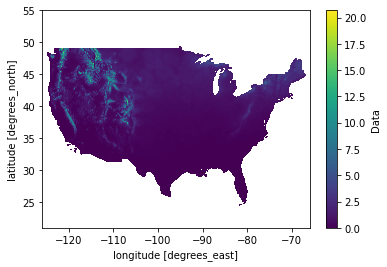

In [41]:
df.Data.plot()

In [45]:
df.rio.set_crs("epsg:3857")

<xarray.Dataset>
Dimensions:     (lat: 850, lon: 1500, nv: 2)
Coordinates:
  * lat         (lat) float64 54.98 54.94 54.9 54.86 ... 21.14 21.1 21.06 21.02
  * lon         (lon) float64 -126.0 -125.9 -125.9 ... -66.1 -66.06 -66.02
Dimensions without coordinates: nv
Data variables:
    lat_bounds  (lat, nv) float64 dask.array<mean_agg-aggregate, shape=(850, ...
    lon_bounds  (lon, nv) float64 dask.array<mean_agg-aggregate, shape=(1500,...
    crs         float64 -3.277e+04
    Data        (lat, lon) float32 dask.array<mean_agg-aggregate, shape=(850,...

In [46]:
df.rio.crs

CRS.from_epsg(3857)

In [48]:
df.Data.rio.to_raster("deep_snow.tif")

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [245]:
lon_min = -124.763068
lon_max = -116.915989
lat_min=45.543541
lat_max=49.002494
wa_df = df.where(df.Data>13.0).where(df.lat > lat_min).where(df.lat < lat_max).where(df.lon > lon_min).where(df.lon < lon_max)

In [254]:
def plot_detail(lon_min, lon_max, lat_min, lat_max, df):
    fig = plt.figure(figsize=(32,32))

    ax = plt.axes(projection=ccrs.AlbersEqualArea(central_lon, central_lat))
    df.Data.plot(ax=ax, transform=ccrs.PlateCarree(),
             vmin=2, vmax=30, cbar_kwargs={'shrink': 0.4})
    ax.coastlines()
    ax.gridlines()
    ax.add_image(google_tiles, 8)
    ax.add_feature(cartopy.feature.STATES, edgecolor='black')
    
    extent = [lon_min, lon_max, lat_min, lat_max]

    ax.set_extent(extent)

/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in greater
  return func(*(_execute_task(a, cache) for a in args))


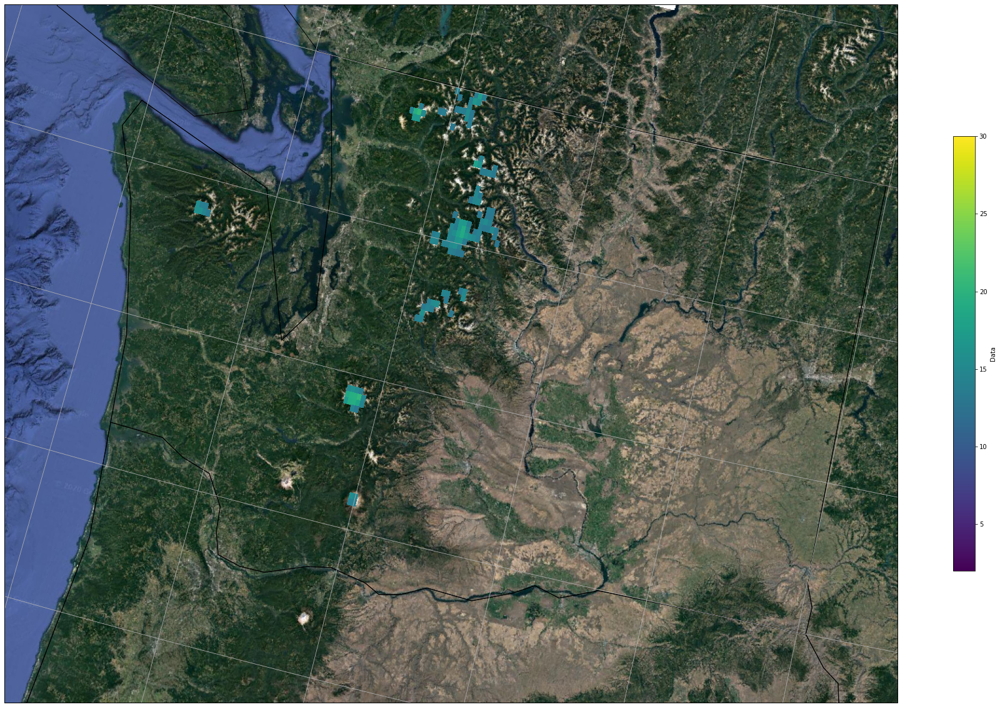

In [255]:

plot_detail(-124.763068, -116.915989, 45.543541, 49.002494, wa_df)

/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in greater
  return func(*(_execute_task(a, cache) for a in args))


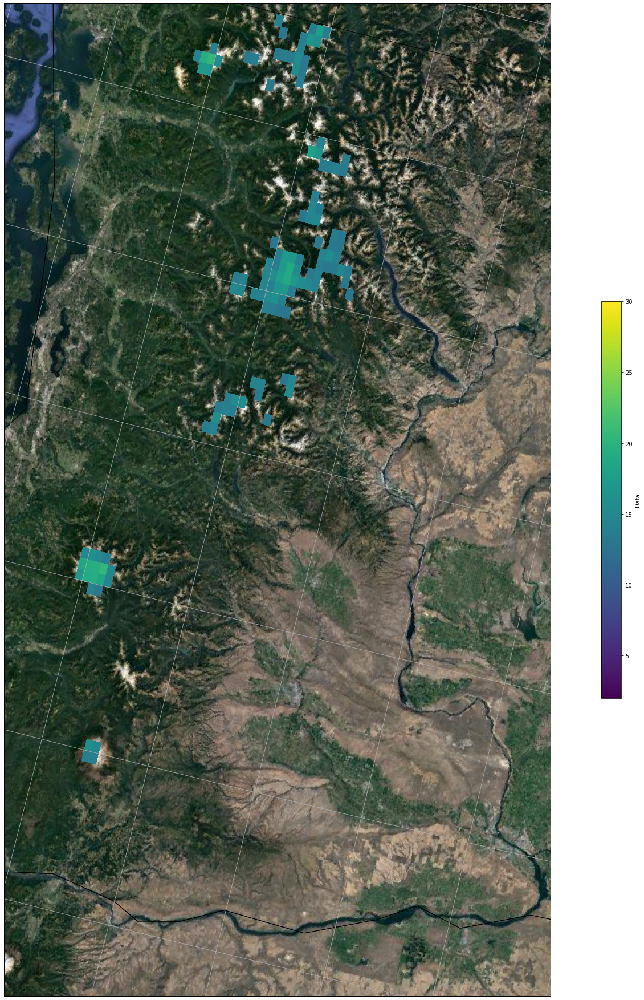

In [256]:
plot_detail(-121.763068, -119.915989, 45.543541, 49.002494, wa_df)

/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/scottcha/anaconda3/envs/pangeo_small/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in greater
  return func(*(_execute_task(a, cache) for a in args))


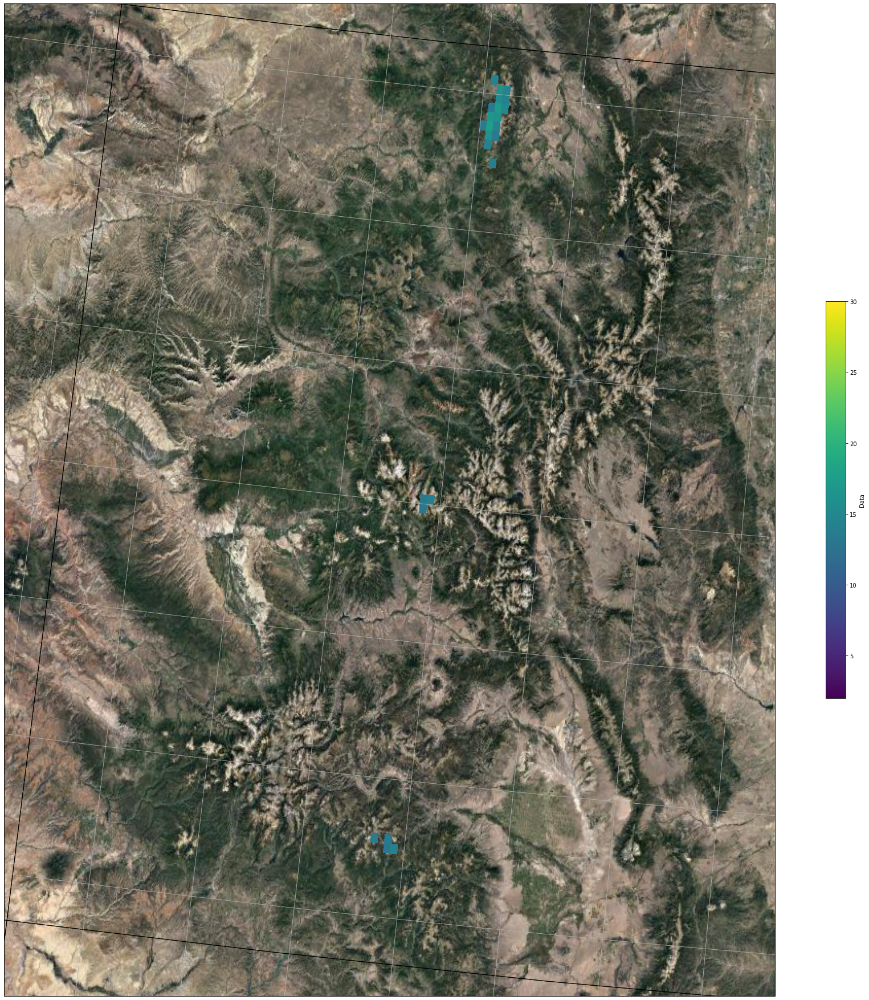

In [258]:

lon_min = -109.060253
lon_max = -105.041524
lat_min = 36.992426
lat_max = 41.003444

co_df = df.where(df.Data>13.0).where(df.lat > lat_min).where(df.lat < lat_max).where(df.lon > lon_min).where(df.lon < lon_max)
plot_detail(lon_min, lon_max, lat_min, lat_max, co_df)

In [49]:
import pandas as pd

In [56]:
df = pd.read_csv('distance_matrix.csv')

/media/scottcha/E1/condaenvs/snowfall/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (7,9,13,15,16,17,19,22,25,27,28,29,30,31,32,33,34,35,36,37,38,39,40,42,43,45,46,47,49,50,51,52,54,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,80,81,82,83,84,85,86,87,88,89,91,94,95,96,99,100,101,102,103,104,108,109,110,111,112,113,114,115,116,117,118,119,120,121,123,124,125,126,129,130,131,132,133,134,135,137,138,139,140,141,142,143,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,164,165,166,167,169,171,172,173,175,176,177,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,204,205,206,207,208,209,210,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,246,247,248,249,250,251,252,253,254,256,257,258,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,2

In [58]:
df.sort_values(by=['Distance']).head(50)

,InputID,TargetID,Distance,Cities_osm_id,Cities_osm_type,Cities_railway,Cities_name,Cities_name_ru,Cities_place,Cities_population,...,Cities_railway:maxspeed:diverging,Cities_railway:turnout_side,Cities_gnis:created,Cities_button_activated,Cities_FIPS_code,Cities_surface,Cities_vehicle,Cities_contact:facebook,Cities_contact:instagram,Cities_contact:twitter
5051,n1899500440,1,1038.716603,1899500440,node,NaN,Scenic,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5052,n1899500440,0,1038.716603,1899500440,node,NaN,Scenic,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4747,n150975844,0,1813.888242,150975844,node,NaN,Government Camp,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4746,n150975844,1,1813.888242,150975844,node,NaN,Government Camp,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4305,n150953525,0,2024.613395,150953525,node,NaN,Kirkwood,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4304,n150953525,1,2024.613395,150953525,node,NaN,Kirkwood,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1355,n151363774,1,3041.395416,151363774,node,NaN,Cooke City,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1356,n151363774,0,3041.395416,151363774,node,NaN,Cooke City,NaN,village,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1621,n151681154,1,3346.116764,151681154,node,NaN,Blue River,NaN,village,864,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1622,n151681154,0,3346.116764,151681154,node,NaN,Blue River,NaN,village,864,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
df.dtypes

InputID      object
TargetID      int64
Distance    float64
dtype: object